# General Notes for this DataFrame and Criteria for It 
## THIS VERSION OF THE DATASET DOES NOT HAVE EVCAR2B, so the dataset is larger.

#There is a Jupyter notebook that thoroughly describes the data extraction, cleaning, and 
#transformation process, and the cleaned data is exported as CSV files for the machine learning model. (10 points)

#A Python script initializes, trains, and evaluates a model or loads a pretrained model. (10 points)

#The model demonstrates meaningful predictive power at least 75% classification accuracy or 0.80 R-squared. (5 points)



# Data Implementation:  Data Cleaning and Preparation

In [1]:
#Setup dependencies and create encoder and standardscaler instances

import os
import pandas as pd
import numpy as np
import scipy.stats as stats

import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
# import pydotplus

from sklearn.preprocessing import OneHotEncoder
encoder = OneHotEncoder(sparse=False) 

from sklearn.datasets import make_regression
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import LeaveOneOut
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC 

from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report

from IPython.display import Image





In [2]:
#This is to turn on and off depending on whether you want to see warnings or not.
# import warnings
# warnings.filterwarnings('ignore')

In [3]:
path ='../../'

In [4]:


EV_df_original_1B = pd.read_csv(path+'ATP_108_Original_csv')

EV_df_original_1B.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10282 entries, 0 to 10281
Data columns (total 39 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   QKEY                 10282 non-null  int64  
 1   ENV2_a_W108          10282 non-null  int64  
 2   ENV2_b_W108          10282 non-null  int64  
 3   ENV2_d_W108          10282 non-null  int64  
 4   ENV2_f_W108          10282 non-null  int64  
 5   EN1_W108             10282 non-null  int64  
 6   EVCAR2_W108          10282 non-null  int64  
 7   EVCAR3_W108          10282 non-null  int64  
 8   EVCAR1_W108          10282 non-null  int64  
 9   ENVIR8_a_W108        10282 non-null  int64  
 10  ENVIR8_e_W108        10282 non-null  int64  
 11  LOCENV_a_W108        10282 non-null  int64  
 12  LOCENV_d_W108        10282 non-null  int64  
 13  LOCENV_e_W108        10282 non-null  int64  
 14  ENVRMPCT_a_W108      10282 non-null  int64  
 15  ENVRMPCT_b_W108      10282 non-null 

In [5]:
# look at data frame
EV_df_original_1B.head()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10282 entries, 0 to 10281
Data columns (total 39 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   QKEY                 10282 non-null  int64  
 1   ENV2_a_W108          10282 non-null  int64  
 2   ENV2_b_W108          10282 non-null  int64  
 3   ENV2_d_W108          10282 non-null  int64  
 4   ENV2_f_W108          10282 non-null  int64  
 5   EN1_W108             10282 non-null  int64  
 6   EVCAR2_W108          10282 non-null  int64  
 7   EVCAR3_W108          10282 non-null  int64  
 8   EVCAR1_W108          10282 non-null  int64  
 9   ENVIR8_a_W108        10282 non-null  int64  
 10  ENVIR8_e_W108        10282 non-null  int64  
 11  LOCENV_a_W108        10282 non-null  int64  
 12  LOCENV_d_W108        10282 non-null  int64  
 13  LOCENV_e_W108        10282 non-null  int64  
 14  ENVRMPCT_a_W108      10282 non-null  int64  
 15  ENVRMPCT_b_W108      10282 non-null 

In [6]:
# list name of columns
print(EV_df_original_1B.columns.tolist())

['QKEY', 'ENV2_a_W108', 'ENV2_b_W108', 'ENV2_d_W108', 'ENV2_f_W108', 'EN1_W108', 'EVCAR2_W108', 'EVCAR3_W108', 'EVCAR1_W108', 'ENVIR8_a_W108', 'ENVIR8_e_W108', 'LOCENV_a_W108', 'LOCENV_d_W108', 'LOCENV_e_W108', 'ENVRMPCT_a_W108', 'ENVRMPCT_b_W108', 'ENVRMPCT_c_W108', 'ENVRMPCT_d_W108', 'ENVRMPCT_e_W108', 'CCPOLICY_e_W108', 'RSTCWRK_a_W108', 'RSTCWRK_b_W108', 'RSTCWRK_c_W108', 'RSTCWRK_d_W108', 'RSTCWRK_e_W108', 'COVID_INFECT_a_W108', 'COVID_INFECT_b_W108', 'GAP21Q12_W108', 'F_MARITAL', 'F_METRO', 'F_CREGION', 'F_AGECAT', 'F_GENDER', 'F_EDUCCAT', 'F_RACETHNMOD', 'F_PARTYSUM_FINAL', 'F_INC_SDT1', 'F_IDEO', 'F_INTFREQ']


In [7]:
# determine # of nulls
EV_df_original_1B.isnull().sum()

QKEY                     0
ENV2_a_W108              0
ENV2_b_W108              0
ENV2_d_W108              0
ENV2_f_W108              0
EN1_W108                 0
EVCAR2_W108              0
EVCAR3_W108              0
EVCAR1_W108              0
ENVIR8_a_W108            0
ENVIR8_e_W108            0
LOCENV_a_W108            0
LOCENV_d_W108            0
LOCENV_e_W108            0
ENVRMPCT_a_W108          0
ENVRMPCT_b_W108          0
ENVRMPCT_c_W108          0
ENVRMPCT_d_W108          0
ENVRMPCT_e_W108          0
CCPOLICY_e_W108          0
RSTCWRK_a_W108           0
RSTCWRK_b_W108           0
RSTCWRK_c_W108           0
RSTCWRK_d_W108           0
RSTCWRK_e_W108           0
COVID_INFECT_a_W108      0
COVID_INFECT_b_W108      0
GAP21Q12_W108            0
F_MARITAL                0
F_METRO                  0
F_CREGION                0
F_AGECAT                 0
F_GENDER                 0
F_EDUCCAT                0
F_RACETHNMOD             0
F_PARTYSUM_FINAL         0
F_INC_SDT1               0
F

In [8]:
#search for keys containing ENV
EV_df_original_1B.filter(like='ENV').columns

Index(['ENV2_a_W108', 'ENV2_b_W108', 'ENV2_d_W108', 'ENV2_f_W108',
       'ENVIR8_a_W108', 'ENVIR8_e_W108', 'LOCENV_a_W108', 'LOCENV_d_W108',
       'LOCENV_e_W108', 'ENVRMPCT_a_W108', 'ENVRMPCT_b_W108',
       'ENVRMPCT_c_W108', 'ENVRMPCT_d_W108', 'ENVRMPCT_e_W108'],
      dtype='object')

In [9]:
EV_df_original_1B[EV_df_original_1B.duplicated()]

,QKEY,ENV2_a_W108,ENV2_b_W108,ENV2_d_W108,ENV2_f_W108,EN1_W108,EVCAR2_W108,EVCAR3_W108,EVCAR1_W108,ENVIR8_a_W108,...,F_METRO,F_CREGION,F_AGECAT,F_GENDER,F_EDUCCAT,F_RACETHNMOD,F_PARTYSUM_FINAL,F_INC_SDT1,F_IDEO,F_INTFREQ


In [10]:
#For 1B dataframe, drop all 99s (that are converted to nulls, first).  Also drop all NAs.
EV_df_original_1B[:] = np.where(EV_df_original_1B == 99, np.nan, EV_df_original_1B)
EV_df_original_1B.dropna(inplace = True)
EV_df_original_1B.reset_index()
EV_df_original_1B.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8684 entries, 0 to 10280
Data columns (total 39 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   QKEY                 8684 non-null   int64  
 1   ENV2_a_W108          8684 non-null   float64
 2   ENV2_b_W108          8684 non-null   float64
 3   ENV2_d_W108          8684 non-null   float64
 4   ENV2_f_W108          8684 non-null   float64
 5   EN1_W108             8684 non-null   float64
 6   EVCAR2_W108          8684 non-null   float64
 7   EVCAR3_W108          8684 non-null   float64
 8   EVCAR1_W108          8684 non-null   float64
 9   ENVIR8_a_W108        8684 non-null   float64
 10  ENVIR8_e_W108        8684 non-null   float64
 11  LOCENV_a_W108        8684 non-null   float64
 12  LOCENV_d_W108        8684 non-null   float64
 13  LOCENV_e_W108        8684 non-null   float64
 14  ENVRMPCT_a_W108      8684 non-null   float64
 15  ENVRMPCT_b_W108      8684 non-null   float

In [12]:
#Recode features with Favor and Oppose responses so Favor =1 and Oppose=0
EV_df_original_1B[['ENV2_a_W108','ENV2_b_W108', 'ENV2_d_W108', 'ENV2_f_W108','EVCAR3_W108', 'CCPOLICY_e_W108']] = EV_df_original_1B[['ENV2_a_W108','ENV2_b_W108', 'ENV2_d_W108', 'ENV2_f_W108','EVCAR3_W108', 'CCPOLICY_e_W108']].replace([2, 1], [0, 1])

EV_df_original_1B.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8684 entries, 0 to 10280
Data columns (total 39 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   QKEY                 8684 non-null   int64  
 1   ENV2_a_W108          8684 non-null   float64
 2   ENV2_b_W108          8684 non-null   float64
 3   ENV2_d_W108          8684 non-null   float64
 4   ENV2_f_W108          8684 non-null   float64
 5   EN1_W108             8684 non-null   float64
 6   EVCAR2_W108          8684 non-null   float64
 7   EVCAR3_W108          8684 non-null   float64
 8   EVCAR1_W108          8684 non-null   float64
 9   ENVIR8_a_W108        8684 non-null   float64
 10  ENVIR8_e_W108        8684 non-null   float64
 11  LOCENV_a_W108        8684 non-null   float64
 12  LOCENV_d_W108        8684 non-null   float64
 13  LOCENV_e_W108        8684 non-null   float64
 14  ENVRMPCT_a_W108      8684 non-null   float64
 15  ENVRMPCT_b_W108      8684 non-null   float

In [13]:
#Recode features with Yes and No responses so Yes=1 and No=0; ***EVCAR1_W108 may be imbalanced***
EV_df_original_1B[['EVCAR1_W108','ENVRMPCT_a_W108','ENVRMPCT_b_W108','ENVRMPCT_c_W108','ENVRMPCT_d_W108','ENVRMPCT_e_W108']] = EV_df_original_1B[['EVCAR1_W108','ENVRMPCT_a_W108','ENVRMPCT_b_W108','ENVRMPCT_c_W108','ENVRMPCT_d_W108','ENVRMPCT_e_W108']].replace([2, 1], [0, 1])

EV_df_original_1B.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8684 entries, 0 to 10280
Data columns (total 39 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   QKEY                 8684 non-null   int64  
 1   ENV2_a_W108          8684 non-null   float64
 2   ENV2_b_W108          8684 non-null   float64
 3   ENV2_d_W108          8684 non-null   float64
 4   ENV2_f_W108          8684 non-null   float64
 5   EN1_W108             8684 non-null   float64
 6   EVCAR2_W108          8684 non-null   float64
 7   EVCAR3_W108          8684 non-null   float64
 8   EVCAR1_W108          8684 non-null   float64
 9   ENVIR8_a_W108        8684 non-null   float64
 10  ENVIR8_e_W108        8684 non-null   float64
 11  LOCENV_a_W108        8684 non-null   float64
 12  LOCENV_d_W108        8684 non-null   float64
 13  LOCENV_e_W108        8684 non-null   float64
 14  ENVRMPCT_a_W108      8684 non-null   float64
 15  ENVRMPCT_b_W108      8684 non-null   float

In [14]:
#Recode feature with 1= "Expand alt.energy" support and 2= "Expand fossil fuels" responses so 2=0 and 1=1
EV_df_original_1B['EN1_W108'] = EV_df_original_1B['EN1_W108'].replace([2, 1], [0, 1])

EV_df_original_1B.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8684 entries, 0 to 10280
Data columns (total 39 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   QKEY                 8684 non-null   int64  
 1   ENV2_a_W108          8684 non-null   float64
 2   ENV2_b_W108          8684 non-null   float64
 3   ENV2_d_W108          8684 non-null   float64
 4   ENV2_f_W108          8684 non-null   float64
 5   EN1_W108             8684 non-null   float64
 6   EVCAR2_W108          8684 non-null   float64
 7   EVCAR3_W108          8684 non-null   float64
 8   EVCAR1_W108          8684 non-null   float64
 9   ENVIR8_a_W108        8684 non-null   float64
 10  ENVIR8_e_W108        8684 non-null   float64
 11  LOCENV_a_W108        8684 non-null   float64
 12  LOCENV_d_W108        8684 non-null   float64
 13  LOCENV_e_W108        8684 non-null   float64
 14  ENVRMPCT_a_W108      8684 non-null   float64
 15  ENVRMPCT_b_W108      8684 non-null   float

In [15]:
#Reverse features so a higher label (i.e., most, all, very) is a higher numeric score. Converted binary features to 0 and 1 values.
#for clarity of interpretation and explanation.  We tried the OrdinalEncoding but the original scales for these features 
#not in a meaningful order, so we opted to use the replace function.  For clarity of interpretation
#and explanation, all oridinal variables/questions/items with a 0 value indicated by their label 
#in the questionnaire were recoded to reflect a 0 value. 
#Also, for EVCAR2_W108, designate 5 as missing data given 0 value will be recoded as 0 ---- not a 1
# EV_df_original_1B['EVCAR2_W108'] = EV_df_original_1B['EVCAR2_W108'].replace({1: 3, 2: 2, 3: 1, 4: 0})

EV_df_original_1B[['GAP21Q12_W108', 'LOCENV_a_W108', 'LOCENV_d_W108', 'LOCENV_e_W108']] = EV_df_original_1B[['GAP21Q12_W108','LOCENV_a_W108', 'LOCENV_d_W108', 'LOCENV_e_W108']].replace([1, 2, 3, 4], [3, 2, 1, 0])

EV_df_original_1B['F_EDUCCAT'] = EV_df_original_1B['F_EDUCCAT'].replace([1, 2, 3], [3, 2, 1])

# EV_df_original_1B[['EVCAR2B_a_W108','EVCAR2B_b_W108','EVCAR2B_c_W108']] = EV_df_original_1B[['EVCAR2B_a_W108','EVCAR2B_b_W108','EVCAR2B_c_W108']].replace([1, 2, 3], [2, 1, 0])

EV_df_original_1B[['COVID_INFECT_a_W108', 'COVID_INFECT_b_W108']] = EV_df_original_1B[['COVID_INFECT_a_W108', 'COVID_INFECT_b_W108']].replace([1, 2, 3, 4], [3, 2, 1, 0])

EV_df_original_1B[['RSTCWRK_a_W108','RSTCWRK_b_W108', 'RSTCWRK_c_W108', 'RSTCWRK_d_W108', 'RSTCWRK_e_W108']] = EV_df_original_1B[['RSTCWRK_a_W108','RSTCWRK_b_W108', 'RSTCWRK_c_W108', 'RSTCWRK_d_W108', 'RSTCWRK_e_W108']].replace([1, 2, 3, 4, 5], [4, 3, 2, 1, 0])

EV_df_original_1B['F_INTFREQ'] = EV_df_original_1B['F_INTFREQ'].replace([5, 4, 3, 2, 1], [1, 2, 3, 4, 5])

EV_df_original_1B[['ENVIR8_a_W108','ENVIR8_e_W108']] = EV_df_original_1B[['ENVIR8_a_W108','ENVIR8_e_W108']].replace([1, 2, 3], [3, 1, 2])

EV_df_original_1B[['F_METRO','F_GENDER']] = EV_df_original_1B[['F_METRO','F_GENDER']].replace([1, 2], [1, 0])

EV_df_original_1B.info()

EV_df_original_1B['EVCAR2_W108'].value_counts()

<class 'pandas.core.frame.DataFrame'>
Index: 8684 entries, 0 to 10280
Data columns (total 39 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   QKEY                 8684 non-null   int64  
 1   ENV2_a_W108          8684 non-null   float64
 2   ENV2_b_W108          8684 non-null   float64
 3   ENV2_d_W108          8684 non-null   float64
 4   ENV2_f_W108          8684 non-null   float64
 5   EN1_W108             8684 non-null   float64
 6   EVCAR2_W108          8684 non-null   float64
 7   EVCAR3_W108          8684 non-null   float64
 8   EVCAR1_W108          8684 non-null   float64
 9   ENVIR8_a_W108        8684 non-null   float64
 10  ENVIR8_e_W108        8684 non-null   float64
 11  LOCENV_a_W108        8684 non-null   float64
 12  LOCENV_d_W108        8684 non-null   float64
 13  LOCENV_e_W108        8684 non-null   float64
 14  ENVRMPCT_a_W108      8684 non-null   float64
 15  ENVRMPCT_b_W108      8684 non-null   float

EVCAR2_W108
2.0    2188
4.0    1996
3.0    1920
1.0    1745
5.0     835
Name: count, dtype: int64

In [16]:
##Reset index
#The reset_index() function is used to reset the index of the DataFrame. 
#The inplace=True argument means that the change is made directly in the original DataFrame, 
#without creating a new DataFrame.
#The drop=True argument means that the old index is completely discarded

EV_df_original_1B.reset_index(inplace=True,drop=True)

In [17]:
#OneHotEncode(r) these features to break out nominal values and creat dummy variables.
#They are broken out and not treated as ordinal because someone who is married is not better/higher in value than
#a single person, and a someone in the Southeast is not more valuable than someone in the Northwest, and so on.

# List of columns to encode
columns_to_encode = ['F_MARITAL', 'F_CREGION', 'F_RACETHNMOD']

# Fit and transform the encoder on the columns
encoded = encoder.fit_transform(EV_df_original_1B[columns_to_encode])

# # Get feature names
feature_names = encoder.get_feature_names_out(columns_to_encode)

# Create a DataFrame with the encoded data
encoded_df = pd.DataFrame(encoded, columns=feature_names)

# Drop the original columns from the DataFrame
EV_df_original_1B = EV_df_original_1B.drop(columns_to_encode, axis=1)


/Users/kim/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


In [18]:
# Concatenate the original DataFrame with the one-hot encoded DataFrame
EV_df_original_1B = pd.concat([EV_df_original_1B, encoded_df], axis=1)
EV_df_original_1B.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8684 entries, 0 to 8683
Data columns (total 51 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   QKEY                 8684 non-null   int64  
 1   ENV2_a_W108          8684 non-null   float64
 2   ENV2_b_W108          8684 non-null   float64
 3   ENV2_d_W108          8684 non-null   float64
 4   ENV2_f_W108          8684 non-null   float64
 5   EN1_W108             8684 non-null   float64
 6   EVCAR2_W108          8684 non-null   float64
 7   EVCAR3_W108          8684 non-null   float64
 8   EVCAR1_W108          8684 non-null   float64
 9   ENVIR8_a_W108        8684 non-null   float64
 10  ENVIR8_e_W108        8684 non-null   float64
 11  LOCENV_a_W108        8684 non-null   float64
 12  LOCENV_d_W108        8684 non-null   float64
 13  LOCENV_e_W108        8684 non-null   float64
 14  ENVRMPCT_a_W108      8684 non-null   float64
 15  ENVRMPCT_b_W108      8684 non-null   f

/var/folders/mp/b71m9bw15b132vxrmh0r66hh0000gn/T/ipykernel_3293/1351010616.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()  # create a new figure


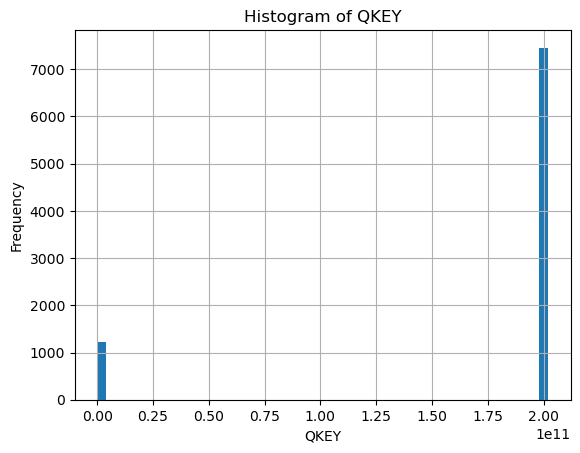

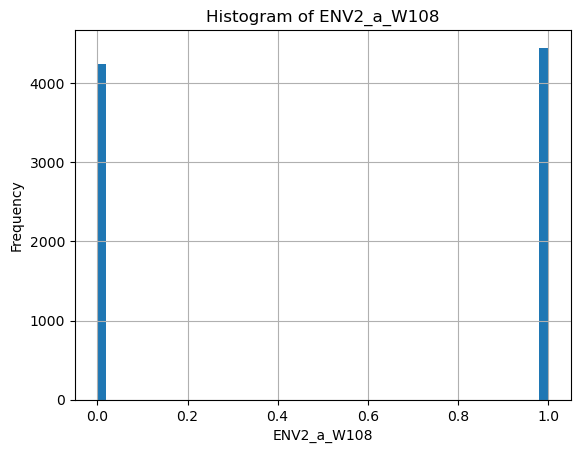

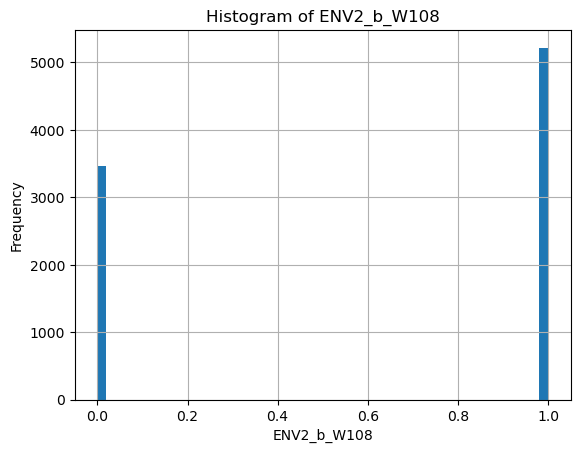

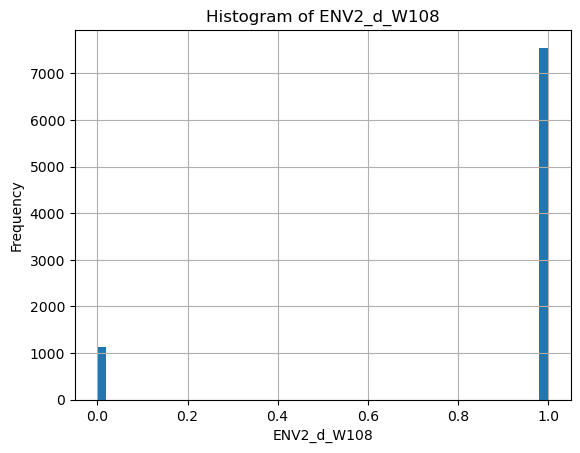

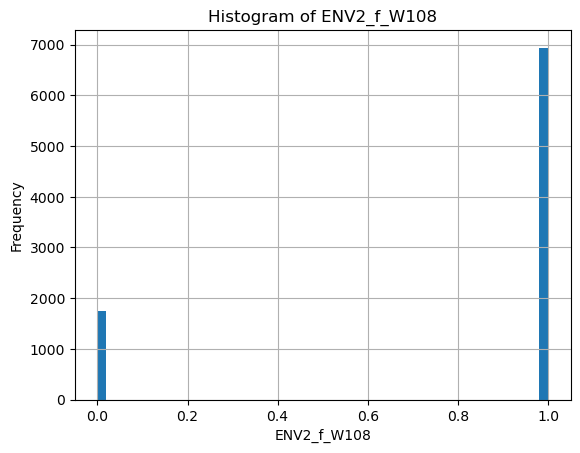

...

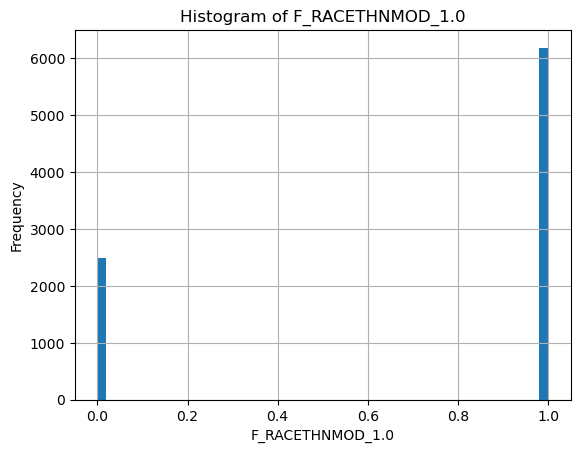

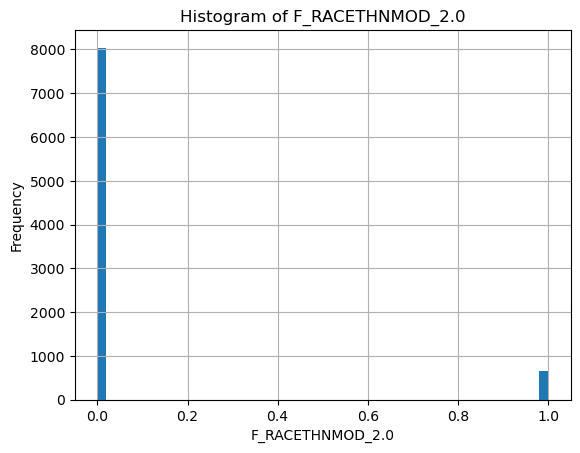

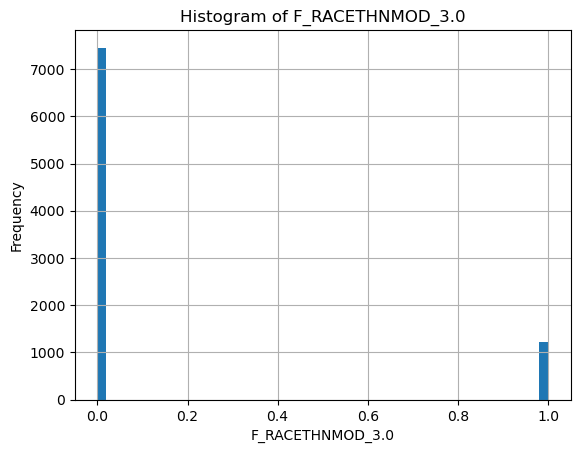

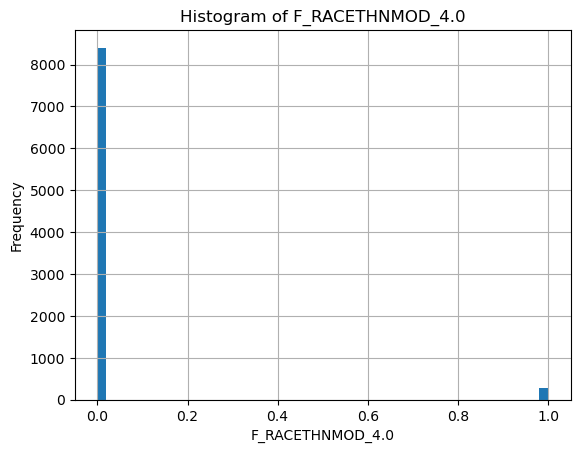

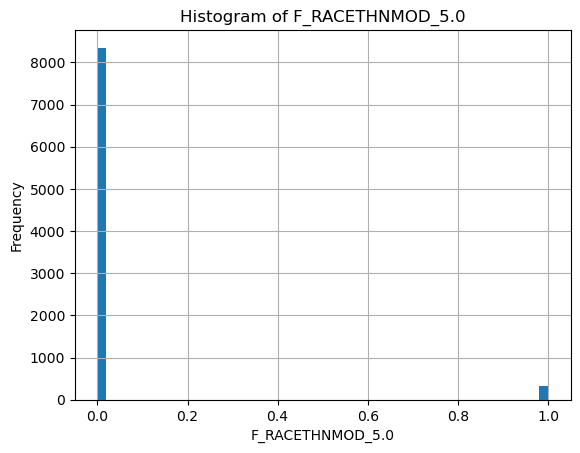

In [19]:
#Initial look at values and distributions with histograms.  Accuracy in recoding?  Imbalances? Eyeshot decent distributions for ordinal data?

for column in EV_df_original_1B:
    plt.figure()  # create a new figure
    EV_df_original_1B[column].hist(bins=50)  # create a histogram for the current column
    plt.title('Histogram of ' + column)  # set the title
    plt.xlabel(column)  # set the x-label
    plt.ylabel('Frequency')  # set the y-label

plt.show()

In [ ]:
#EDA ... to guide our model selection...

#Target selection and testing (including feature independence - correlation and VIF):

#EVCAR2 Next time buy a car... (linear regression, SVC, )... to include EVCAR1 as independent variable
#-Looks like it is a pretty normal distribution
#-We can test the normality with: 
    #Perform the normality test
    #k2, p = stats.normaltest(df['data'])
    #alpha = 0.05

    
    
#EVCAR1 - Do you have one or not (resampling as a strategy?)
#-Imbalanced based on histogram but... there are ways for us to handle that
    #-See What things correlate with it
    #-VIF
    #-RFC 
    #Going forward should we do some resampling or SVC, XGBoost, SMOTE, or ... is it ok?
    

#EN1 Priority - traditional versus alternative (classification outcome? Unexpected finding?)
#-Imbalanced based on histogram but... there are ways for us to handle that
    #-See What things correlate with it
    #-VIF
    #-RFC 
    #Going forward should we do some resampling or SVC, XGBoost, SMOTE, or ... is it ok?
    

#EVCAR3 - Favor production of new gasoline cars and trucks by 2035 (Logistic regression?)
#-This one is fairly balanced 
    #-See What things correlate with it
    #-VIF
    #-RFC 
    #Going forward should we do some resampling or SVC, XGBoost, SMOTE, or ... is it ok?
    

#CCPOLICYe - Agree with incentives for evs to combat climate change
#-Imbalanced based on histogram but... there are ways for us to handle that
    #-See What things correlate with it
    #-VIF
    #-RFC 
    #Going forward should we do some resampling or SVC, XGBoost, SMOTE, or ... is it ok?

#Which features to "deselect" 
#What to anticipate with our data under certain models.
#Is our question more interested in balanced accuracy and/or AUC ROC curve...  sensitivity, precision
    
###--------APPENDICES--------------------------------------------------------
    #Feature interdependence and importance -  correlations with target and multicollinearity
    #Multi-collinearity:  VIF
    #RFC...Feature importance--- Random forest for feature selection

    #Revisit:  Distributions for each feature in the data that 
    #More to potentially revisit:  Test normal districutionsTest for outliers and/or skewness for some of the demographic variables and determine if it matters.
        #F_EDUCCAT (Education)
        #F_INC_SDT1 (Income)
        #F_AGECAT (Age)
        #F_METRO (Metro to non-metro)
        #F_GENDER (Gender)
        #F_RACETHNMOD (Ethnicity and race)
        #F_CREGION
        #F_PARTYSUM_FINAL
        #F_IDEO
        #F_INTFREQ
    
   

   
    
#What to anticipate with our data under certain models.
#Is our question more interested in balanced accuracy and/or AUC ROC curve...  sensitivity, precision

#Spice up a charts with ChatGPT recommendations


# Data Implementation:  Exploratory Data Analysis and Continued Data Preparation
## Analyses to refine feature evaluation, importance, and selection prior to model selection and evaluation

In [20]:
#Copy is done to avoid modifying the original DataFrame when subsequent operations are 
#performed on the copied DataFrame.

subset_df = EV_df_original_1B.copy()

In [21]:
# list name of columns in subset dataframe
print(subset_df.columns.tolist())

['QKEY', 'ENV2_a_W108', 'ENV2_b_W108', 'ENV2_d_W108', 'ENV2_f_W108', 'EN1_W108', 'EVCAR2_W108', 'EVCAR3_W108', 'EVCAR1_W108', 'ENVIR8_a_W108', 'ENVIR8_e_W108', 'LOCENV_a_W108', 'LOCENV_d_W108', 'LOCENV_e_W108', 'ENVRMPCT_a_W108', 'ENVRMPCT_b_W108', 'ENVRMPCT_c_W108', 'ENVRMPCT_d_W108', 'ENVRMPCT_e_W108', 'CCPOLICY_e_W108', 'RSTCWRK_a_W108', 'RSTCWRK_b_W108', 'RSTCWRK_c_W108', 'RSTCWRK_d_W108', 'RSTCWRK_e_W108', 'COVID_INFECT_a_W108', 'COVID_INFECT_b_W108', 'GAP21Q12_W108', 'F_METRO', 'F_AGECAT', 'F_GENDER', 'F_EDUCCAT', 'F_PARTYSUM_FINAL', 'F_INC_SDT1', 'F_IDEO', 'F_INTFREQ', 'F_MARITAL_1.0', 'F_MARITAL_2.0', 'F_MARITAL_3.0', 'F_MARITAL_4.0', 'F_MARITAL_5.0', 'F_MARITAL_6.0', 'F_CREGION_1', 'F_CREGION_2', 'F_CREGION_3', 'F_CREGION_4', 'F_RACETHNMOD_1.0', 'F_RACETHNMOD_2.0', 'F_RACETHNMOD_3.0', 'F_RACETHNMOD_4.0', 'F_RACETHNMOD_5.0']


In [22]:
# shape of subset dataframe
subset_df.shape

(8684, 51)

In [23]:
# heat map for correlation matrix
fig = plt.figure(figsize=(36,36), dpi = 480)
sns.heatmap(subset_df.corr(),annot = True, fmt = '.2f')
plt.show()

In [24]:
#X = subset_df[['EVCAR2_W108', 'EVCAR2B_a_W108', 'EVCAR2B_b_W108', 'EVCAR2B_c_W108','F_GENDER','F_AGECAT','F_EDUCCAT',
#               'F_RACETHNMOD','F_PARTYSUM_FINAL','F_MARITAL', 'F_CREGION',]]#,'F_METRO',

#taking most of the columns in the data set
X = subset_df.drop(['F_METRO','QKEY',], axis=1)
#y = subset_df[['F_AGECAT']].values.reshape(-1,)
y = subset_df[['F_METRO']].values.reshape(-1,)
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=1)
scaler = StandardScaler().fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)
data = [X_train_scaled, X_test_scaled, y_train, y_test]

In [25]:
print(X.columns.tolist())

['ENV2_a_W108', 'ENV2_b_W108', 'ENV2_d_W108', 'ENV2_f_W108', 'EN1_W108', 'EVCAR2_W108', 'EVCAR3_W108', 'EVCAR1_W108', 'ENVIR8_a_W108', 'ENVIR8_e_W108', 'LOCENV_a_W108', 'LOCENV_d_W108', 'LOCENV_e_W108', 'ENVRMPCT_a_W108', 'ENVRMPCT_b_W108', 'ENVRMPCT_c_W108', 'ENVRMPCT_d_W108', 'ENVRMPCT_e_W108', 'CCPOLICY_e_W108', 'RSTCWRK_a_W108', 'RSTCWRK_b_W108', 'RSTCWRK_c_W108', 'RSTCWRK_d_W108', 'RSTCWRK_e_W108', 'COVID_INFECT_a_W108', 'COVID_INFECT_b_W108', 'GAP21Q12_W108', 'F_AGECAT', 'F_GENDER', 'F_EDUCCAT', 'F_PARTYSUM_FINAL', 'F_INC_SDT1', 'F_IDEO', 'F_INTFREQ', 'F_MARITAL_1.0', 'F_MARITAL_2.0', 'F_MARITAL_3.0', 'F_MARITAL_4.0', 'F_MARITAL_5.0', 'F_MARITAL_6.0', 'F_CREGION_1', 'F_CREGION_2', 'F_CREGION_3', 'F_CREGION_4', 'F_RACETHNMOD_1.0', 'F_RACETHNMOD_2.0', 'F_RACETHNMOD_3.0', 'F_RACETHNMOD_4.0', 'F_RACETHNMOD_5.0']


# Data Implementation:  Supervised Learning
## Why?
## Analyses to help answer and predict why consumers intend to purchase or have purchased an electric vehicle/EV

In [26]:
# Create a StandardScater model and fit it to the training data
X_scaler = StandardScaler()
X_scaler.fit(X_train)

StandardScaler()

In [27]:
# Transform the training and testing data by using the X_scaler model
X_train_scaled = X_scaler.transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

k: 1, Train/Test Score: 1.000/0.818
k: 3, Train/Test Score: 0.899/0.859
k: 5, Train/Test Score: 0.887/0.877
k: 7, Train/Test Score: 0.884/0.879
k: 9, Train/Test Score: 0.882/0.879
k: 11, Train/Test Score: 0.881/0.881
k: 13, Train/Test Score: 0.881/0.881
k: 15, Train/Test Score: 0.881/0.882
k: 17, Train/Test Score: 0.881/0.882
k: 19, Train/Test Score: 0.880/0.882


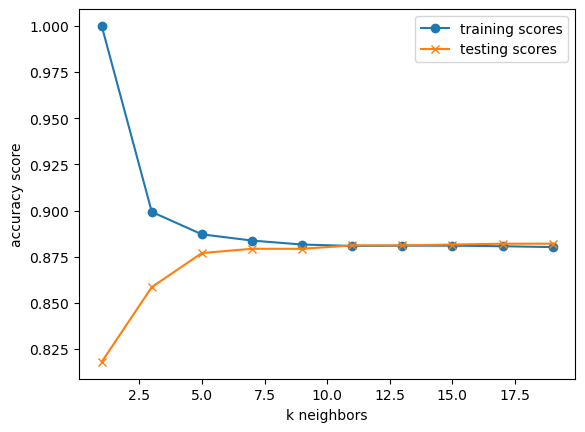

In [28]:
# Loop through different k values to find which has the highest accuracy.
# Note: We use only odd numbers because we don't want any ties.
train_scores = []
test_scores = []
for k in range(1, 20,2):
    knn = KNeighborsClassifier(n_neighbors=k)#, p=5)
    knn.fit(X_train_scaled, y_train)
    train_score = knn.score(X_train_scaled, y_train)
    test_score = knn.score(X_test_scaled, y_test)
    train_scores.append(train_score)
    test_scores.append(test_score)
    print(f"k: {k}, Train/Test Score: {train_score:.3f}/{test_score:.3f}")
    
# Plot the results
plt.plot(range(1, 20, 2), train_scores, marker='o', label="training scores")
plt.plot(range(1, 20, 2), test_scores, marker="x", label="testing scores")
plt.xlabel("k neighbors")
plt.ylabel("accuracy score")
plt.legend()
plt.show()

In [29]:
# Train the KNN model with the best k value
best_k_value =5
knn = KNeighborsClassifier(n_neighbors=best_k_value)
knn.fit(X_train_scaled, y_train)
print(f'k={best_k_value} Test Acc: {round(knn.score(X_test_scaled, y_test),3)}')

k=5 Test Acc: 0.877


In [30]:
knn_predict = knn.predict(X_test_scaled)

In [31]:
target_names= ['Non-metropolitan','Metropolitan' ]
print(classification_report(y_test, knn_predict,target_names=target_names))

                  precision    recall  f1-score   support

Non-metropolitan       0.40      0.07      0.12       258
    Metropolitan       0.89      0.99      0.93      1913

        accuracy                           0.88      2171
       macro avg       0.65      0.53      0.53      2171
    weighted avg       0.83      0.88      0.84      2171



In [32]:
print(confusion_matrix(y_test, knn_predict, labels = [0,1]))

[[  19  239]
 [  28 1885]]


<Axes: xlabel='F_INC_SDT1', ylabel='F_AGECAT'>

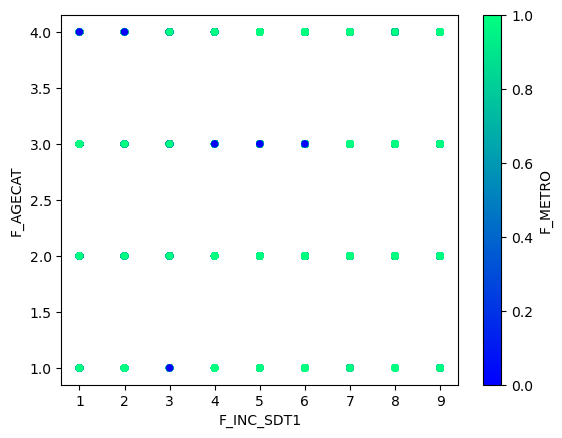

In [33]:
# Plot the data points 
subset_df.plot.scatter(
    x="F_INC_SDT1", 
    y="F_AGECAT",
    c="F_METRO", 
    colormap='winter')

not very intresting as the metro and non-metro fall on top of each other

Text(0.5, 0, 'response')

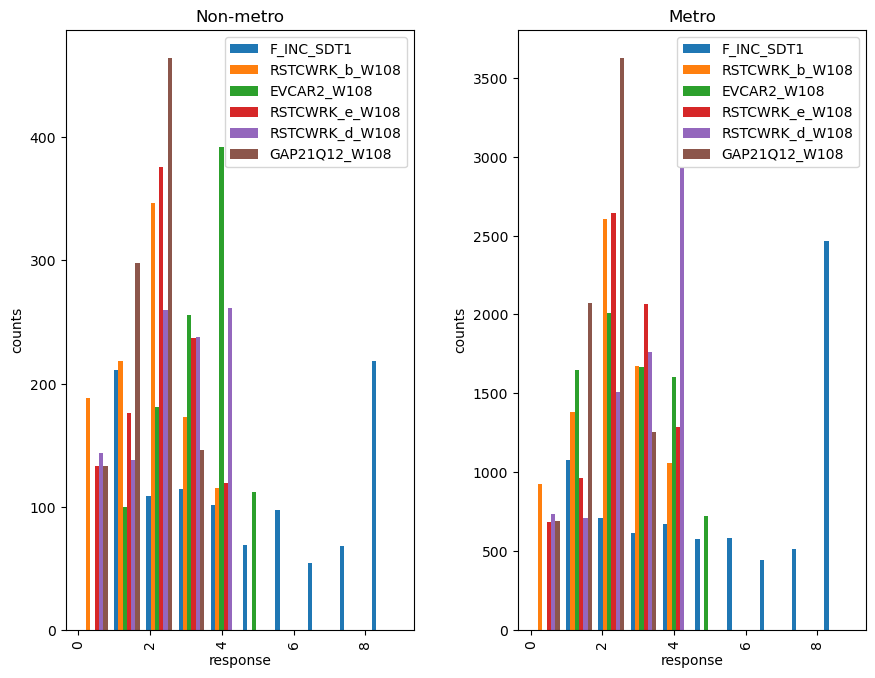

In [34]:
# plotting histograms most important features
ax=subset_df.hist(column=['F_INC_SDT1', 'RSTCWRK_b_W108', 'EVCAR2_W108', 'RSTCWRK_e_W108', 'RSTCWRK_d_W108', 
                          'GAP21Q12_W108'], by="F_METRO", figsize=(10, 8),legend=True)
ax[1].set_title("Metro")
ax[0].set_ylabel("counts")
ax[0].set_xlabel("response")
ax[0].set_title("Non-metro")
ax[1].set_ylabel("counts")
ax[1].set_xlabel("response")

most important features appear somewhat as normal distributions expect for F_INT_SDT1 

Text(0.5, 0, 'response')

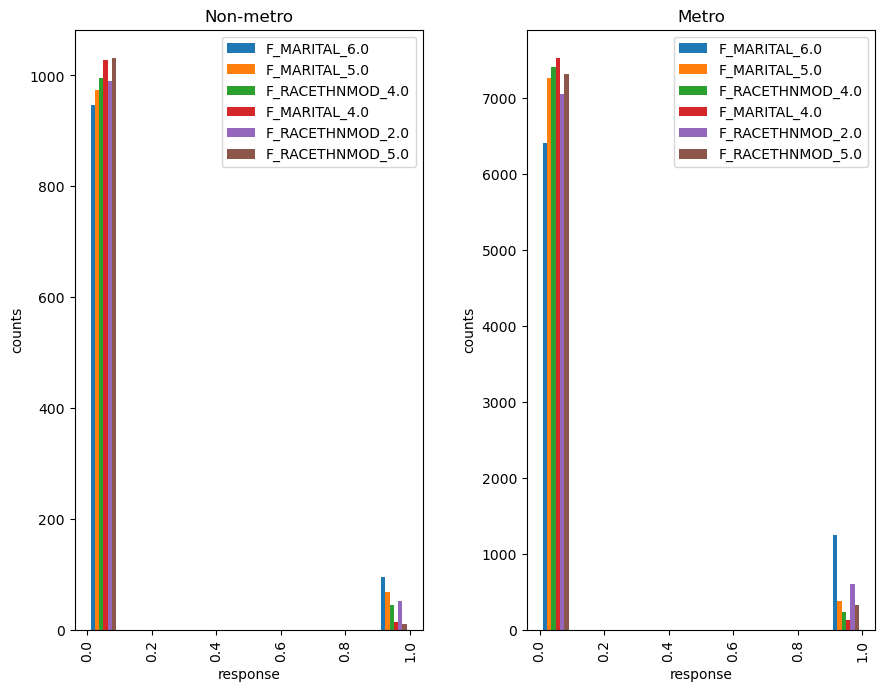

In [35]:
# plotting histograms least important features
ax=subset_df.hist(column=['F_MARITAL_6.0', 'F_MARITAL_5.0','F_RACETHNMOD_4.0', 'F_MARITAL_4.0', 'F_RACETHNMOD_2.0',
                          'F_RACETHNMOD_5.0'], by="F_METRO", figsize=(10, 8),legend=True)
ax[1].set_title("Metro")
ax[0].set_ylabel("counts")
ax[0].set_xlabel("response")
ax[0].set_title("Non-metro")
ax[1].set_ylabel("counts")
ax[1].set_xlabel("response")

least important features appear to be imbalanced

In [36]:
# Create the decision tree classifier instance
treemodel = tree.DecisionTreeClassifier(criterion='gini')#  'gini', 'log_loss', 'entropy'

In [37]:
# Fit the model
treemodel = treemodel.fit(X_train_scaled, y_train)

In [38]:
# Making predictions using the testing data
tree_predictions = treemodel.predict(X_test)

/Users/kim/anaconda3/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(


In [39]:
# Calculate the accuracy score
tree_acc_score = accuracy_score(y_test, tree_predictions)

print(f"Accuracy Score : {tree_acc_score}")

Accuracy Score : 0.8811607554122525


In [40]:
# Create DOT data
dot_data = tree.export_graphviz(
    treemodel, out_file=None, feature_names=X.columns, class_names=["0", "1"], filled=True, max_depth=5
)

# Draw graph
graph = pydotplus.graph_from_dot_data(dot_data)

# Show graph
Image(graph.create_png())

NameError: name 'pydotplus' is not defined

In [ ]:
print(classification_report(y_test, tree_predictions, target_names=target_names))

In [ ]:
# Train the Random Forest model
clf = RandomForestClassifier(random_state=1, n_estimators=8)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=1)

# Scale the data
scaler = StandardScaler().fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [ ]:
# Train the Random Forest model
clf =clf.fit(X_train_scaled, y_train)

# Evaluate the model
print(f'Training Score: {clf.score(X_train_scaled, y_train)}')
print(f'Testing Score: {clf.score(X_test_scaled, y_test)}')

In [ ]:
# Get the feature importance array
feature_importances = clf.feature_importances_

In [ ]:
# sorting features by importance
importances_sorted = sorted(zip(feature_importances, X.columns), reverse=True)
importances_sorted[:]

In [ ]:
# Plot the feature importances
features = sorted(zip(X.columns, feature_importances), key = lambda x: x[1])
cols = [f[0] for f in features]
width = [f[1] for f in features]

fig, ax = plt.subplots()

fig.set_size_inches(8,6)
plt.margins(y=0.001)

ax.barh(y=cols, width=width)

plt.show()

In [ ]:
clf_predict = clf.predict(X_test_scaled)

In [ ]:
print(classification_report(y_test, clf_predict, target_names=target_names))

In [ ]:
# checking svc model with different kernels
for kernel in ('rbf', 'linear','sigmoid'):
    for c in (0.00001,0.0001, 0.001, 0.01, 1):
        # Create the support vector machine classifier model with different kernels
        svcmodel = SVC(kernel=kernel, C=c,probability=True)
        svcmodel.fit(X_train, y_train)
        score = svcmodel.score(X_test, y_test)
        print( kernel, c, score)

In [ ]:
# print score 
svcmodel = SVC(kernel='rbf', C=0.001)

In [ ]:
# Split data into training and testing
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=4)

In [ ]:
# Fit the model to the training data
svcmodel.fit(X_train, y_train)

In [ ]:
# Validate the model by checking the model accuracy with model.score
print('Train Accuracy: %.3f' % svcmodel.score(X_train, y_train))
print('Test Accuracy: %.3f' % svcmodel.score(X_test, y_test))

In [ ]:
svc_predict = svcmodel.predict(X_test_scaled)

In [ ]:
print(classification_report(y_test, svc_predict, target_names=target_names))

# Data Model Evalaution and Optimization:  Supervised Learning
## Analyses to assess various iterations of model performance

# Data Implementation:  Unsupervised Learning
## Who?  
## Principal components analysis and cluster analysis are used to refine our understanding of who intends to purchase or has purhcased an electric vehicle/EV


# Data Model Evalaution and Optimization:  Unsupervised Learning
## Analyses to assess various iterations of model performance